In [ ]:
#default_exp peak_maps

# Peak slice maps

> Slicing the cube  

In [ ]:
#hide 
%load_ext autoreload
%autoreload 2 
%matplotlib notebook

In [ ]:
# hide 
import os
os.chdir('/home/frank/Work/Projecten/DoRe/viz/raw_nmf')

In the previous section we saw that a specific hotmax spectrum contains a specific peak pattern that can be explained by the presence of one or more chemical elements. In some cases this combination of elements can be explained to result from a single specific substance. In other cases the occurrence of multiple elements is caused by the presence of different materials that are present at a single spatial position. In order to make further deductions it is important to inspect the spatial patterns (i.e. maps) within the image cube. Let's explore two examples.    

## Brass 

Let's take a look again at the overview of hotmax spectra in the plot directly below. 

In [ ]:
from maxrf4u import HotmaxAtlas, plot_puzzle, plot_ptrn  

hma = HotmaxAtlas('RP-T-1898-A-3689.datastack')

hma.plot_spectra()

Spectra *12*, *13* and *14* show the presence of copper and zinc. It is likely that we find here a little piece of brass that came loose from the paper making equipment like a mold or hammer beater. In order to confirm this hypothesis we need to inspect the spatial intensity distribution of the corresponding peak slices and ultimately compare with high resolution photography. 

As a first step let's check the hotmax pixel locations of the three spectra. 

In [ ]:
hma.hotmax_pixels[[12, 13, 14]]

array([[489, 122, 900],
       [489, 122, 960],
       [489, 122, 984]])

Ah, this is in fact a single spectrum. This makes it straightforward to extract the relevant peak-slice-maps. 

<IPython.core.display.Javascript object>


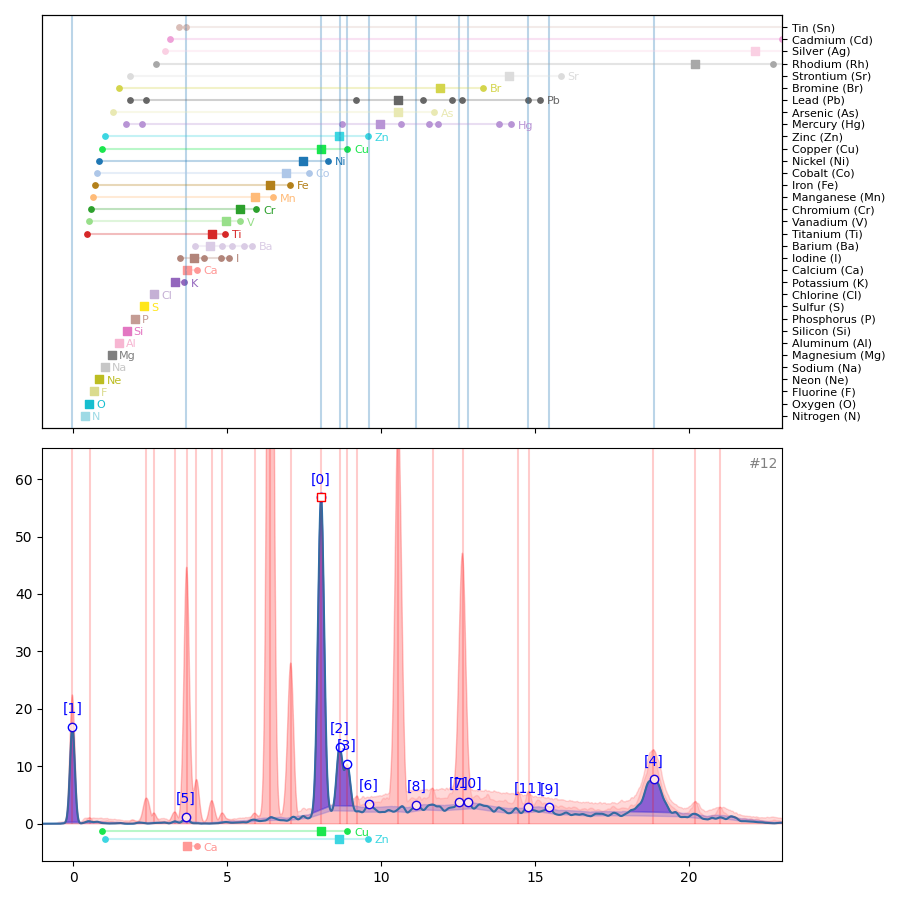

In [ ]:
n = 12
ax0, ax1 = plot_puzzle(hma, n)

# patterns 
plot_ptrn('Cu', -1, ax1);
plot_ptrn('Zn', -2, ax1);
plot_ptrn('Ca', -3, ax1);

In [ ]:
x_keVs = hma.x_keVs
y_hotmax = hma.hotmax_spectra[12]

peaks_xy, slices = get_slices(x_keVs, y_hotmax) 

In [ ]:
%matplotlib notebook

In [ ]:
import matplotlib.pyplot as plt 

<IPython.core.display.Javascript object>


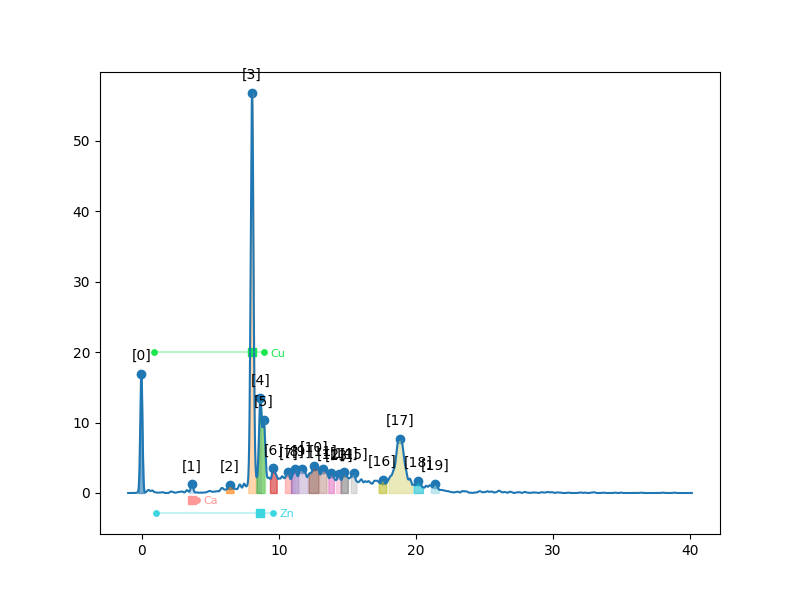

{'elem': 'Ca',
 'name': 'Calcium',
 'peaks_xy': array([[3.69184592, 1.        ],
        [4.0070035 , 0.12535353]]),
 'color': array([1.        , 0.59607843, 0.58823529])}

In [ ]:
fig, ax = plt.subplots(figsize=[8, 6])

plot_peak_slices(x_keVs, y_hotmax, ax=ax)
plot_ptrn('Cu', 20, ax)
plot_ptrn('Zn', -5, ax)
plot_ptrn('Ca', -0.8, ax)

In [ ]:

import scipy.signal as ssg 
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib.cm as cm


def get_slices(x_calib, y_max, prominence=0.5, rel_height=0.2):  
    '''Returns: *peaks_xy*, *slices*'''

    # peak positions and properties 
    peak_indices, shapes_dict = ssg.find_peaks(y_max, prominence=prominence)
    peaks_x, peaks_y = x_calib[peak_indices], y_max[peak_indices]
    ip_widths, heights, left_ips, right_ips = ssg.peak_widths(y_max, peak_indices, rel_height=rel_height) 

    # estimate peak bases 2 x 2 x width at rel_height 0.2  
    dx = x_calib[1] - x_calib[0]
    left_bases = peaks_x -  2 * dx * ip_widths
    right_bases = peaks_x +  2 * dx * ip_widths 

    # find nearest index positions 
    left_bases_idx = np.array([np.argmin((x_calib - lb)**2) for lb in left_bases]) 
    right_bases_idx = np.array([np.argmin((x_calib - rb)**2) for rb in right_bases]) 

    # combine 
    peaks_xy = np.c_[peaks_x, peaks_y]
    slices = np.c_[left_bases_idx, peak_indices, right_bases_idx]
    
    return peaks_xy, slices



def get_peakmaps(arr, x_calib, y_max, prominence=0.5, rel_height=0.2, norm=True): 
    '''Integrate peak slices into peak maps and keV maps. 
    
    Returns: peak_maps, keV_maps'''
    
    peaks_xy, slices = get_slices(x_calib, y_max, prominence=prominence, rel_height=rel_height)

    peak_maps = []
    keV_maps = []

    for i, [si, sj, sk] in enumerate(slices): 
        
        print(f'{i}/{len(slices)}', end='\r')
    
        peak_slice = arr[:,:,si:sk+1].compute()
        d = sk - si 
        
        peak_map = np.sum(peak_slice, axis=2) / d - (peak_slice[:,:,0] + peak_slice[:,:,-1]) / 2 
        
        if norm:  
            peak_map = peak_map / peak_map.max()
            # no clipping to study better the low signal noise 
            # peak_map = np.clip(peak_map, a_min=0, a_max=1)
        
        keV_idx_map = si + np.argmax(peak_slice, axis=2)
        keV_map = x_calib[keV_idx_map]

        peak_maps.append(peak_map) 
        keV_maps.append(keV_map)
        
    return peak_maps, keV_maps 



def plot_peak_slices(x_calib, y_max, ax=None, prominence=0.5, rel_height=0.2, 
                     grid=False, labels='simple', figsize=[8, 5]): 
    '''Utility function to plot the results of get_slices()'''
    
    peaks_xy, slices = get_slices(x_calib, y_max, prominence=prominence, rel_height=rel_height)
    zero = np.zeros_like(x_calib) 

    if ax is None: 
        fig, ax = plt.subplots(figsize=figsize)    
    else: 
        fig = ax.get_figure()
        
    ax.plot(x_calib, y_max)
    
    if labels is 'simple': 
        peak_labels = [f'[{i}]' for i in range(len(peaks_xy))]    
    elif labels is 'full': 
        peak_labels = [f'[{i}]\n{keV:.03f}keV' for i, [keV, _] in enumerate(peaks_xy)]    
    else: 
        assert False, 'Option labels=  can be "simple" or "full"'        

    [ax.annotate(s, xy, xytext=(0, 10), ha='center', textcoords='offset points') for s, xy in zip(peak_labels, peaks_xy)]

    ax.scatter(*peaks_xy.T)
    if grid: 
        ax.grid()

    # colorize peak slices 
    n_slices = len(slices) 
    colors = cm.tab20(np.arange(n_slices) % 20)
    
    
    [ax.fill_between(x_calib, zero, y_max, alpha=0.6, color=color, 
                     where=np.r_[np.zeros(i), np.ones(k - i), np.zeros(len(x_calib) - k)]) 
     for [i, j, k], color in zip(slices, colors)];
    
    return fig, ax 




### Slicing the cube into peak maps 

Different elements that are present in the artwork emit x-ray induced fluorescence at characteristic wavelengths. Let's start with an inspection of the max spectrum to see at which energy bands we find emission peaks.  

In [ ]:
ds = maxrf4u.DataStack('RP-T-1898-A-3689.datastack')

In [ ]:
peaks_xy, slices = maxrf4u.get_slices(ds.energies(), ds.max_spectrum())

In [ ]:
import matplotlib.pyplot as plt 
import myutils as mu 

def multi_plot(*images, titles=None, axis_off=False, fig_width=9, 
               sharex=True, sharey=True, vmin=None, vmax=None, cmap='Greys_r', 
               fontsize='xx-large', zoom_xyc=None, zoom_half_wh=[100, 100]): 
    '''Inspect multiple images simultaneously... 
    
    Fold along multiple rows if n > 4'''
    
    nrows_max = 4 
    n_img = len(images)
    
    nrows = (n_img // nrows_max) # completely filled rows 
    rest = n_img % nrows_max 
    if rest != 0:
        nrows = nrows + 1
    
    if n_img <= nrows_max: 
        ncols = n_img
    else: 
        ncols = nrows_max
        
    figsize = [fig_width, fig_width/2 + 2 * (nrows -1)]
    
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize, squeeze=False, sharex=sharex, sharey=sharey)
    
    for i, img in enumerate(images): 
    
        axs.flatten()[i].imshow(img, cmap=cmap, vmin=vmin, vmax=vmax)
            
    if titles is not None:
        for i, t in enumerate(titles): 
            axs.flatten()[i].set_title(t, fontsize=fontsize)
    
    if axis_off: 
        axs_flat = axs.flatten()
        for ax in axs_flat: 
            ax.set_axis_off()
            
    # remove (ugly) empty subplots 
    for ax in axs.flatten()[n_img:nrows*ncols]: 
        ax.remove()
        
    fig.subplots_adjust(hspace=0.4, wspace=0.4)    
            
    plt.tight_layout()
    
    return fig, axs 

In [ ]:
peak_maps, keV_maps = maxrf4u.get_peakmaps(ds.maxrf_cube, ds.energies(), ds.max_spectrum())

In [ ]:
remarks = ['[0] ?', '[1] ?', '[2] S_KL2+Pb_M5O2','[3] K_KL2', '[4] Ca_KL3', '[5] Ca_KM2', 
           '[6] Ti_KL2', '[7] ?', '[8] ?', '[9] Fe_KL3', '[10] Fe_KM2', '[11] Cu_KL2', '[12] Zn_KL3', 
           '[13] Cu_KM2', '[14] Pb_L3M1', '[15] Pb_L3M5', '[16] Pb_L3N4', '[17] ?', '[18] Pb_L2N4', '[19] Compton Rh_Ka', 
           '[20] Rh_KL3', '[21] Compton Rh_Kb']  

titles = [f'{rem} {keV:.02f}' for rem, keV in zip(remarks, peaks_xy[:,0])]

In [ ]:
peak_maps_histeq = [mu.histeq(pm) for pm in peak_maps]

<IPython.core.display.Javascript object>


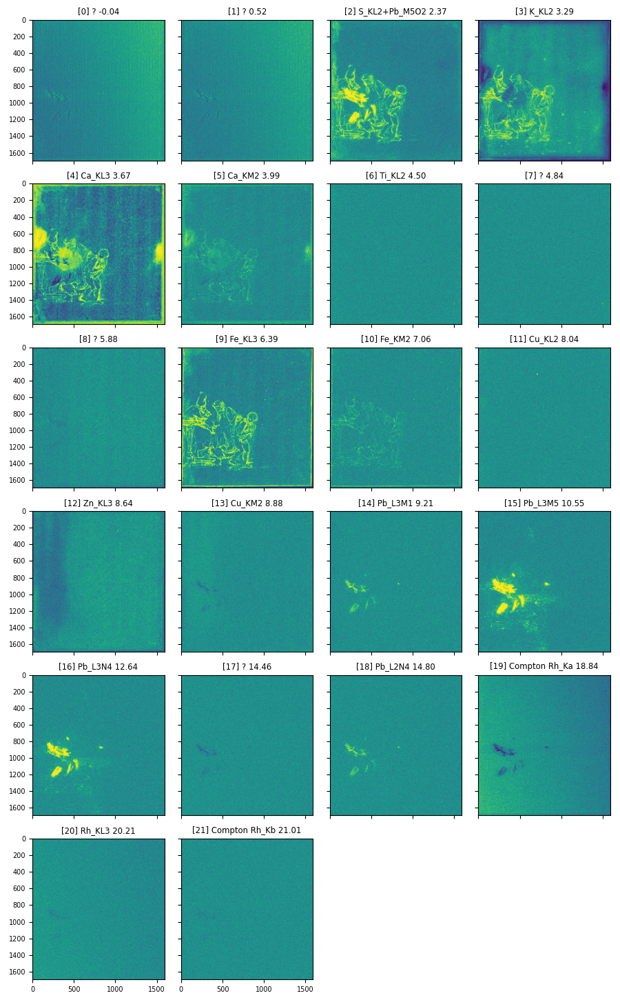

In [ ]:
fig, axs = multi_plot(*peak_maps_histeq, titles=titles, fontsize='large', cmap='viridis', axis_off=False);

In [ ]:
axs.flatten()[-1].remove()

In [ ]:
plu.multi_plot?

In [ ]:
def get_noise_level(peak_map, noise_frac=0.5): 
    '''Estimates noise level from negative noise. 
    
    Returns: *noise_level*, *is_negative*'''
    
    is_negative = peak_map < 0 

    # determine cumulative negative noise level distribution 
    res = sstats.cumfreq(peak_map[is_negative], numbins=10)

    bins = res.lowerlimit + np.linspace(0, res.binsize*res.cumcount.size, res.cumcount.size)
    hist = 1 - res.cumcount / res.cumcount.max() 

    level_i = np.argmin((hist - noise_frac)**2)
    noise_level = -bins[level_i] 

    return noise_level, is_negative 

In [ ]:
ds = maxrf4u.DataStack('RP-T-1898-A-3689.datastack')

x_keVs = ds.energies()
y_max = ds.max_spectrum()

<IPython.core.display.Javascript object>


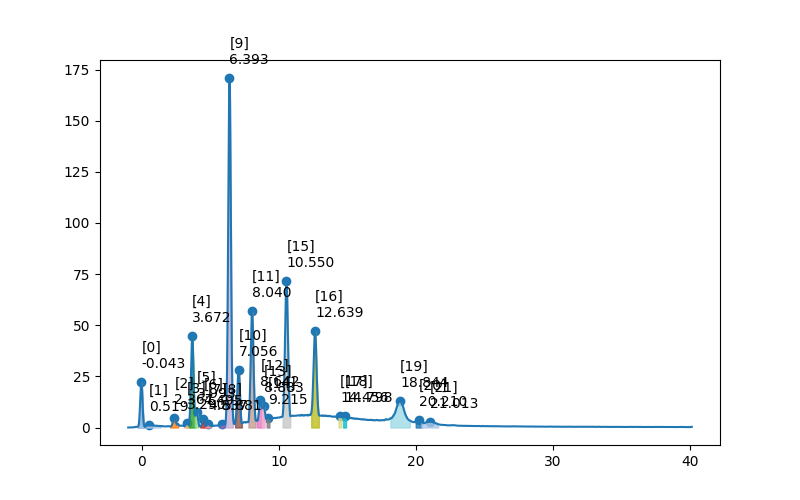

In [ ]:
plot_peak_slices(x_keVs, y_max);

In [ ]:
get_slices(x_keVs, y_max)

## Iron segmentation 

Before doing anything else, such as image registration or a speckle atlas, it is necessary to segment the iron map into speckles+ink+paper...    

See again: https://scikit-image.org/docs/dev/auto_examples/features_detection/plot_blob.html#sphx-glr-auto-examples-features-detection-plot-blob-py

## Speckles 

### Interesting and annoying speckles 

### `maxrf4u.speckles.py` 

In [ ]:
import skimage.measure as skm 
import numpy as np 

class SpeckleAtlas(): 
    
    def __init__(self, peak_map, n_heights=100): 
        
        
        self.peak_map = peak_map 
        
        h, w = self.peak_map.shape
        self.n_px =  h * w 
        
        self.heights = np.linspace(peak_map.min(), peak_map.max(), n_heights)
        
        # perhaps better just iterate 
        height_maps = [self.peak_map > h for h in self.heights] 

        largest_area_list = [] 
        largest_label_list = []
        n_regions_list = []

        for i, hm in enumerate(height_maps): 

            print(f'Inspecting height slice: {i}/{n_heights}', end='\r')

            label_image = skm.label(height_maps[i].astype(int), connectivity=1)
            props = skm.regionprops(label_image)
            n_regions_list.append(len(props))
            areas_labels = np.array([[p.area, p.label] for p in props])

            label_image = skm.label(height_maps[i], connectivity=1)

            props = skm.regionprops(label_image)

            areas_labels = np.array([[p.area, p.label] for p in props])

            # in case of zero regions:  
            if len(areas_labels) == 0: 
                areas_labels = np.array([[0, 0]])

            areas, labels = areas_labels.T

            largest_area_i = np.argmax(areas)
            largest_area = areas[largest_area_i]
            largest_label = labels[largest_area_i]

            largest_area_list.append(largest_area)
            largest_label_list.append(largest_label) 
                
        
        self.largest_areas = largest_area_list   
        self.largest_labels = largest_label_list 
        self.n_regions = n_regions_list 

    def measure_speckles(self, max_area=100): 
        '''Find, sort, label and measure speckle regions.  
        
        Selects lowest height slice with all speckle regions smaller then *max_area*. 
        
        Returns: *clip_height* '''
        
        # find largest speckle and associated clip height 
        self.max_area = max_area 
        self.clip_height_i = np.argmin((np.array(self.largest_areas) - max_area)**2) 
        self.clip_height = self.heights[self.clip_height_i] 
        self.largest_speckle_label = self.largest_labels[self.clip_height_i] 
        
        # unsorted label image for clip level  
        unsorted_label_image = skm.label(self.peak_map > self.clip_height)
        uprops = skm.regionprops(unsorted_label_image) 

        u_areas = np.array([p.area for p in uprops])
        u_labels = np.array([p.label for p in uprops]) # [1, 2, 3 ...]

        # create area sorted labels 
        indices = np.argsort(u_areas)[::-1]
        area_sorted_labels = u_labels[indices]

        #prepend zero index for background 
        area_sorted_labels_bg = np.r_[0, area_sorted_labels]
        
        # make relabel lut 
        n_labels = len(area_sorted_labels_bg)
        relabel_lut = np.zeros(n_labels, dtype=int)
        
        # say region with label 123 is largest speckle 
        # then lut[123] = 1 
        relabel_lut[area_sorted_labels_bg] = np.arange(n_labels)
        
        # took me quite some time to debug so let's make sure next time 
        assert relabel_lut[area_sorted_labels_bg[1]] == 1, 'Relabeling of image went wrong' 
        
        self.relabel_image = relabel_lut[unsorted_label_image] 
        
        # determine region props 
        self.props = skm.regionprops(self.relabel_image, intensity_image=self.peak_map)
        
        self.centroids_y, self.centroids_x = np.array([p.centroid for p in self.props]).T
        self.centroids_xy = np.c_[self.centroids_x, self.centroids_y]
                                  
        return self.clip_height 
    
    
    def speckle_spectrum(self, arr, speckle_i): 
        '''Get averaged speckle spectrum for region of *speckle_i*. 
        
        Returns: *spectrum*
        -------
        '''

        print(speckle_i, end='\r')

        p = self.props[speckle_i]
        
        spectrum = region_spectra(arr, mask=p.image, average=True)
               
        return spectrum 
    

In [ ]:
peak_maps, keV_maps = maxrf4u.get_peakmaps(ds.maxrf_cube, ds.energies(), ds.max_spectrum())

In [ ]:
iron = peak_maps[9]

In [ ]:
iron.max()

1.0

<IPython.core.display.Javascript object>


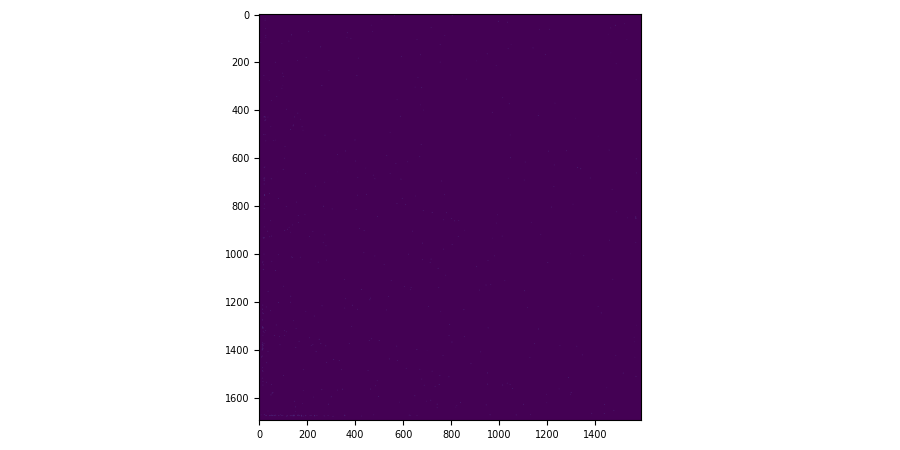

(<Figure size 900x450 with 1 Axes>, array([[<AxesSubplot:>]], dtype=object))

In [ ]:
multi_plot(iron, vmax=0.03)

In [ ]:
sa = SpeckleAtlas(iron)

In [ ]:
sa.measure_speckles()

0.03513991471492883

In [ ]:
speckles_x, speckles_y = sa.centroids_xy.T

<IPython.core.display.Javascript object>


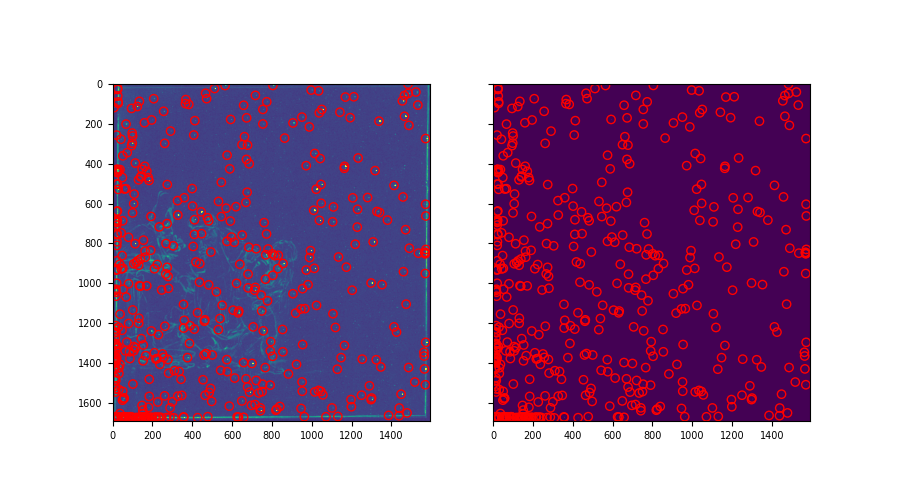

In [ ]:
fig, axs = plt.subplots(ncols=2, squeeze=True, sharex=True, sharey=True, figsize=[9, 5])
ax, ax1 = axs 
ax.imshow(iron, vmax=0.03)
ax1.scatter(speckles_x, speckles_y, facecolor='none', edgecolor='r')
ax.scatter(speckles_x, speckles_y, facecolor='none', edgecolor='r')
ax1.imshow(sa.relabel_image)

In [ ]:
sa.relabel_image.max()

495

Is it possible to get a sum image that can be used for image registration? 

In [ ]:
h, w, n = ds.maxrf_cube.shape

In [ ]:
sum_image = ds.maxrf_cube[:,:,100:n].sum(axis=2)

In [ ]:
sum_im = sum_image.compute()

In [ ]:
sum_im = sum_im / n

In [ ]:
maxrf4u.IRON_Ka

6.4032016008004

In [ ]:
peaks_xy

array([[-4.33671381e-02,  2.24201965e+01],
       [ 5.18950384e-01,  1.03660882e+00],
       [ 2.36656510e+00,  4.47129393e+00],
       [ 3.29037246e+00,  2.05318689e+00],
       [ 3.67194506e+00,  4.46399460e+01],
       [ 3.99326936e+00,  7.68807507e+00],
       [ 4.49533858e+00,  4.01460123e+00],
       [ 4.83674565e+00,  1.87345469e+00],
       [ 5.88104962e+00,  1.83583868e+00],
       [ 6.39316022e+00,  1.71131897e+02],
       [ 7.05589158e+00,  2.79770107e+01],
       [ 8.03994725e+00,  5.68118744e+01],
       [ 8.64243031e+00,  1.34473858e+01],
       [ 8.88342353e+00,  1.04026098e+01],
       [ 9.21478921e+00,  4.83900642e+00],
       [ 1.05502933e+01,  7.17649231e+01],
       [ 1.26389013e+01,  4.70944862e+01],
       [ 1.44563918e+01,  5.52164507e+00],
       [ 1.47977989e+01,  5.63242197e+00],
       [ 1.88444768e+01,  1.28910427e+01],
       [ 2.02101051e+01,  3.87582064e+00],
       [ 2.10134158e+01,  2.87180996e+00]])

In [ ]:
list(ds.energies()).index(maxrf4u.IRON_Ka)

737

<IPython.core.display.Javascript object>


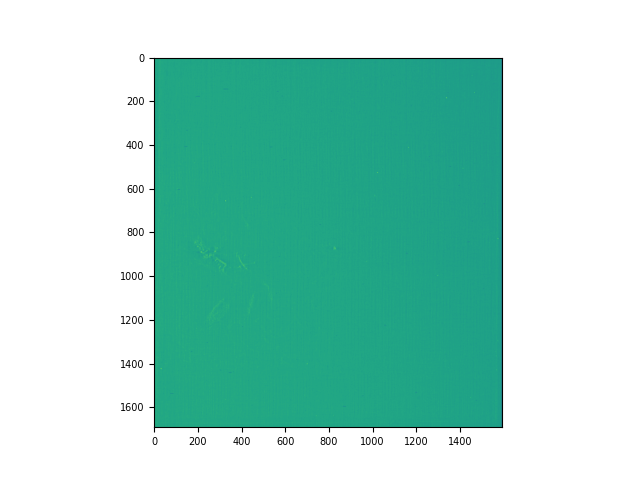

In [ ]:
fig, ax = plt.subplots()
ax.imshow(sum_im)